In [1]:
# import libraries and dependencies

import os, requests
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import montage
from sklearn.decomposition import PCA
import matplotlib.patheffects as path_effects
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, Reshape
from tensorflow.keras.optimizers import Adam
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import warnings

warnings.filterwarnings("ignore")
%config InlineBackend.figure_format = 'retina'


c:\Users\Rodrigo\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# Data Analysis

### Data Collection and Wrangling

In [2]:
# Download data
fnames = ["kay_labels.npy", "kay_labels_val.npy", "kay_images.npz"]
urls = ["https://osf.io/r638s/download",
        "https://osf.io/yqb3e/download",
        "https://osf.io/ymnjv/download"]

for fname, url in zip(fnames, urls):
  if not os.path.isfile(fname):
    try:
      r = requests.get(url)
    except requests.ConnectionError:
      print("!!! Failed to download data !!!")
    else:
      if r.status_code != requests.codes.ok:
        print("!!! Failed to download data !!!")
      else:
        print(f"Downloading {fname}...")
        with open(fname, "wb") as fid:
          fid.write(r.content)
        print(f"Download {fname} completed!")

In [3]:
with np.load(fname) as dobj:
  dat = dict(**dobj)
labels = np.load('kay_labels.npy')
val_labels = np.load('kay_labels_val.npy')


print(f'Stimuli shape: {dat["stimuli"].shape}')
print(f'Response shape: {dat["responses"].shape}')
print(f'Labels shape: {labels.shape}')

Stimuli shape: (1750, 128, 128)
Response shape: (1750, 8428)
Labels shape: (4, 1750)



`labels` is a 4 by stim array of class names:  
- row 3 has the labels predicted by a deep neural network (DNN) trained on Imagenet
- rows 0-2 correspond to different levels of the wordnet hierarchy for the DNN predictions

In [ ]:
labels[:3,:]

array([['artifact', 'entity', 'animal', ..., 'artifact', 'artifact',
        'artifact'],
       ['instrumentality', 'round shape', 'vertebrate', ..., 'structure',
        'structure', 'instrumentality'],
       ['equipment', 'sphere', 'mammal', ..., 'building', 'landing',
        'conveyance']], dtype='<U71')

In [ ]:
print(labels[:, :4])
print(dat.keys())

[['artifact' 'entity' 'animal' 'animal']
 ['instrumentality' 'round shape' 'vertebrate' 'vertebrate']
 ['equipment' 'sphere' 'mammal' 'amphibian']
 ['croquet ball' 'bubble' 'komondor' 'tailed frog']]
dict_keys(['stimuli', 'stimuli_test', 'responses', 'responses_test', 'roi', 'roi_names'])


`dat` has the following fields:  
- `stimuli`: stim x i x j array of grayscale stimulus images
- `stimuli_test`: stim x i x j array of grayscale stimulus images in the test set  
- `responses`: stim x voxel array of z-scored BOLD response amplitude
- `responses_test`:  stim x voxel array of z-scored BOLD response amplitude in the test set  
- `roi`: array of voxel labels
- `roi_names`: array of names corresponding to voxel labels

This is the number of voxels in each ROI. Note that `"Other"` voxels have been removed from this version of the dataset:

We are going to use the stimuli, responses and roi

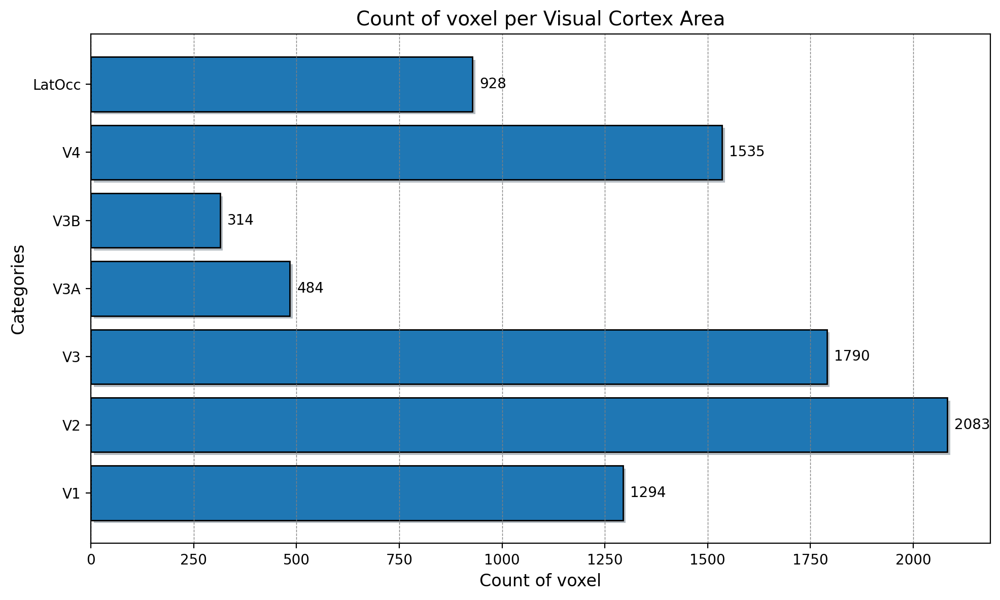

In [4]:
roi_counts = dict(zip(dat["roi_names"], np.bincount(dat["roi"])))

values = list(roi_counts.values())[1:]
names = list(roi_counts.keys())[1:]

# Create a horizontal bar plot
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(names, values, edgecolor='black')

# Add grid lines
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', axis='x')

# Add value annotations to each bar
for bar in bars:
    width = bar.get_width()
    ax.annotate(f'{width}', xy=(width, bar.get_y() + bar.get_height() / 2),
                xytext=(5, 0), textcoords="offset points",
                ha='left', va='center', fontsize=10, color='black')

# Customize title and labels
plt.xlabel('Count of voxel', fontsize=12)
plt.ylabel('Categories', fontsize=12)
plt.title('Count of voxel per Visual Cortex Area', fontsize=14)

# Customize ticks
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Add shadow effect to the bars
for bar in bars:
    bar.set_path_effects([plt.matplotlib.patheffects.withSimplePatchShadow()])

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()

Each stimulus is a 128 x 128 grayscale array with 1750 total of images

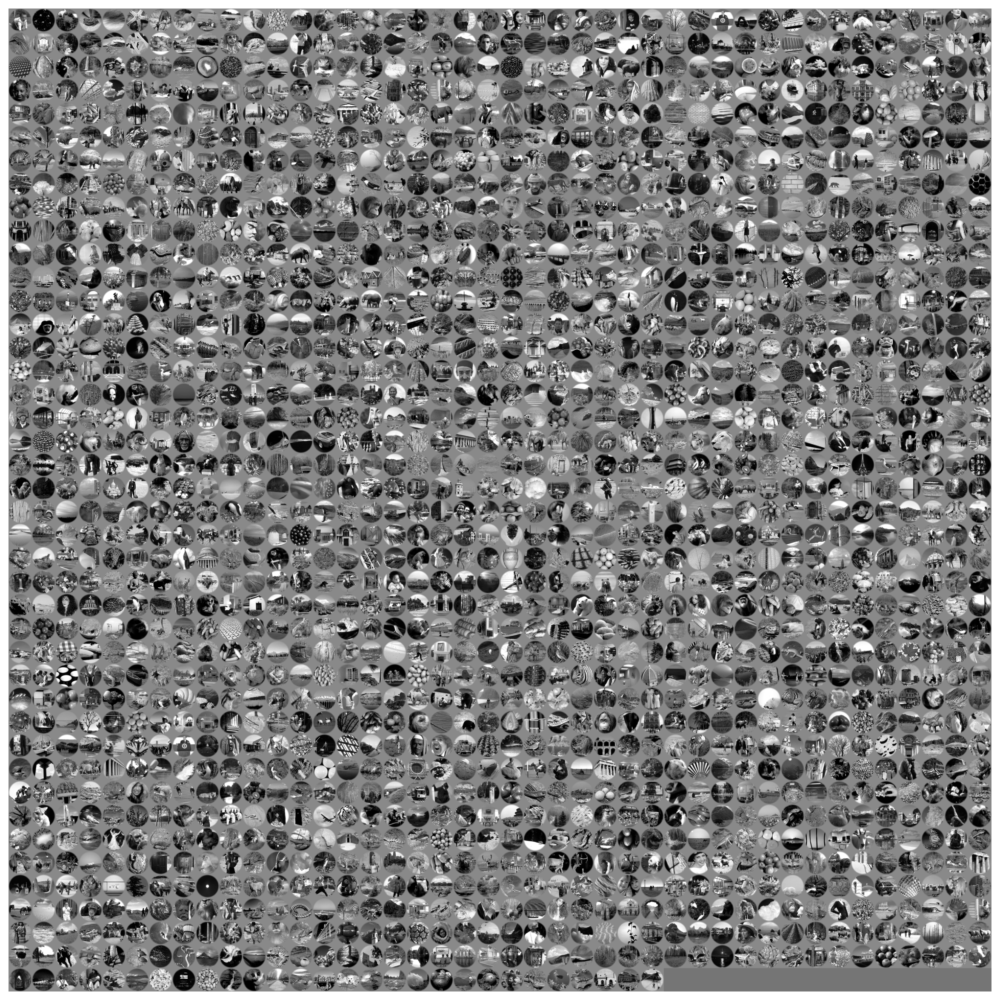

In [5]:
out = montage(dat['stimuli'])
f, ax = plt.subplots(figsize = (15,15))
plt.imshow(out, cmap = 'gray'); plt.axis('off');

In [6]:
fig, axs = plt.subplots(2, 4, figsize=(12, 6), sharex=True, sharey=True)
for ax, im, lbl in zip(axs.flat, dat["stimuli"]:
  ax.imshow(im, cmap="gray")
  ax.set_title(lbl)
fig.tight_layout()
fig.show()

SyntaxError: invalid syntax (1457503021.py, line 2)

Each stimulus is associated with a pattern of BOLD response across voxels in visual cortex:

C:\Users\Rodrigo\AppData\Local\Temp\ipykernel_13444\2625672689.py:7: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


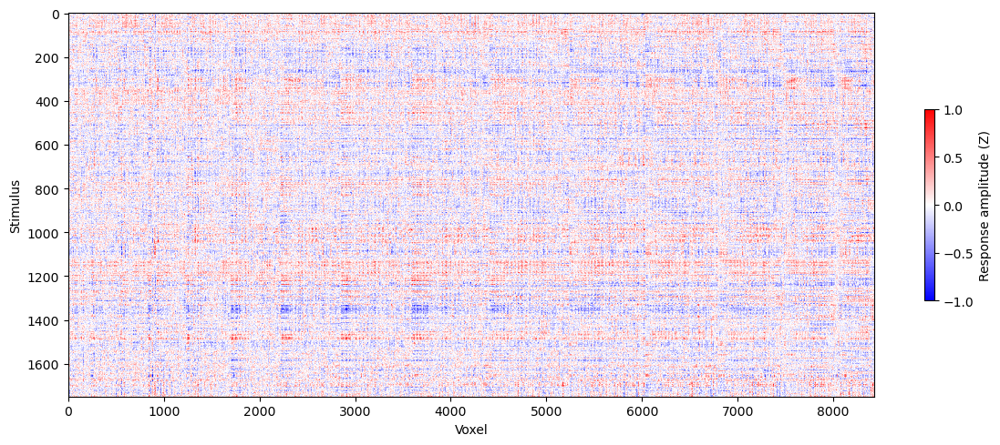

In [ ]:
fig, ax = plt.subplots(figsize=(12, 5))
ax.set(xlabel="Voxel", ylabel="Stimulus")
heatmap = ax.imshow(dat["responses"],
                    aspect="auto", vmin=-1, vmax=1, cmap="bwr")
fig.colorbar(heatmap, shrink=.5, label="Response amplitude (Z)")
fig.tight_layout()
fig.show()

Each horizontal line represents the voxel/response from the brain for each stimuli. As you can see, there are strips of similar responses indicating similar stimulis have similiar brain responses.

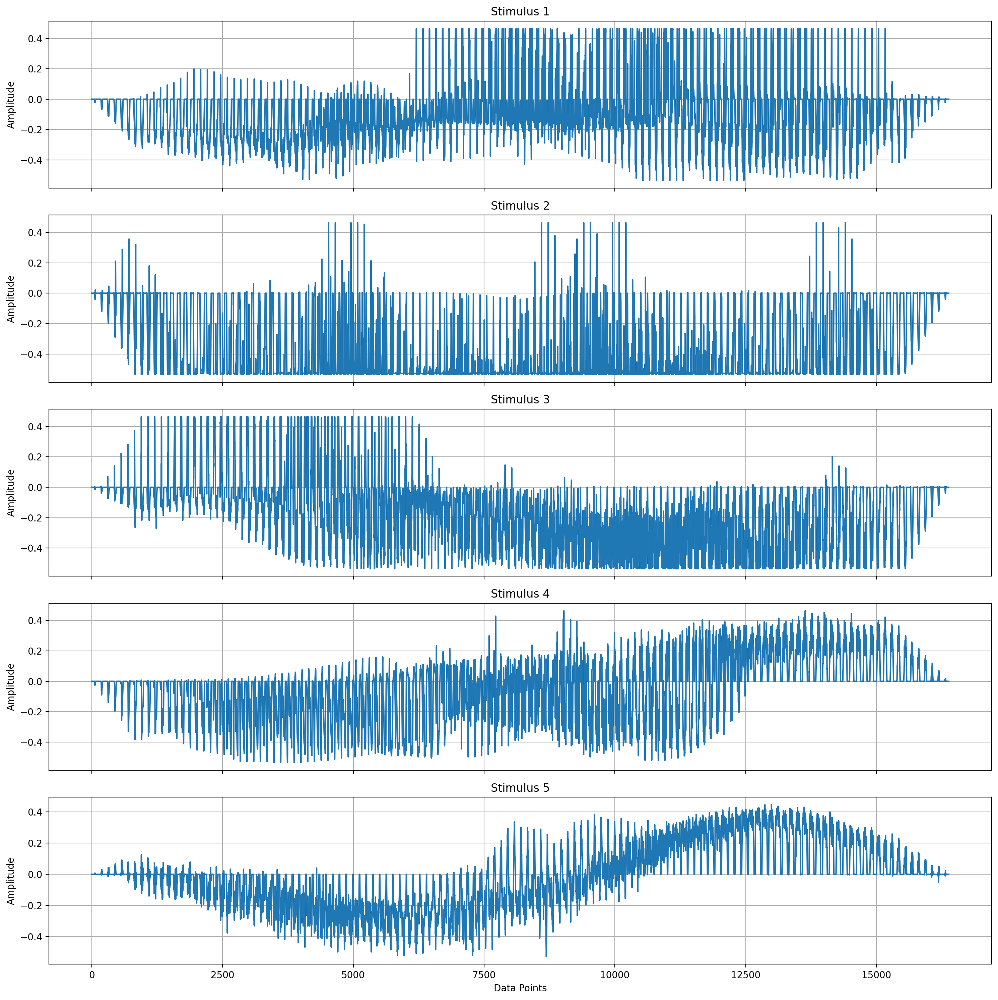

In [7]:
# Create 10 subplots for the first 10 stimuli in the data array
fig, axes = plt.subplots(5, 1, figsize=(15, 15), sharex=True)

# Flatting the data of stimilis
flat_dat = np.reshape(dat['stimuli'], (dat['stimuli'].shape[0],-1))

for i in range(5):
    axes[i].plot(flat_dat[i])
    axes[i].set_title(f'Stimulus {i+1}')
    axes[i].set_ylabel('Amplitude')
    axes[i].grid(True)

plt.xlabel('Data Points')
plt.tight_layout()
plt.show()

Visual representation of the first five stimuli (images) in a flattened version of their pixel representations. Each graph depicts the pixel intensity values for one of the images, showcasing the variations in pixel intensity across the entire image.

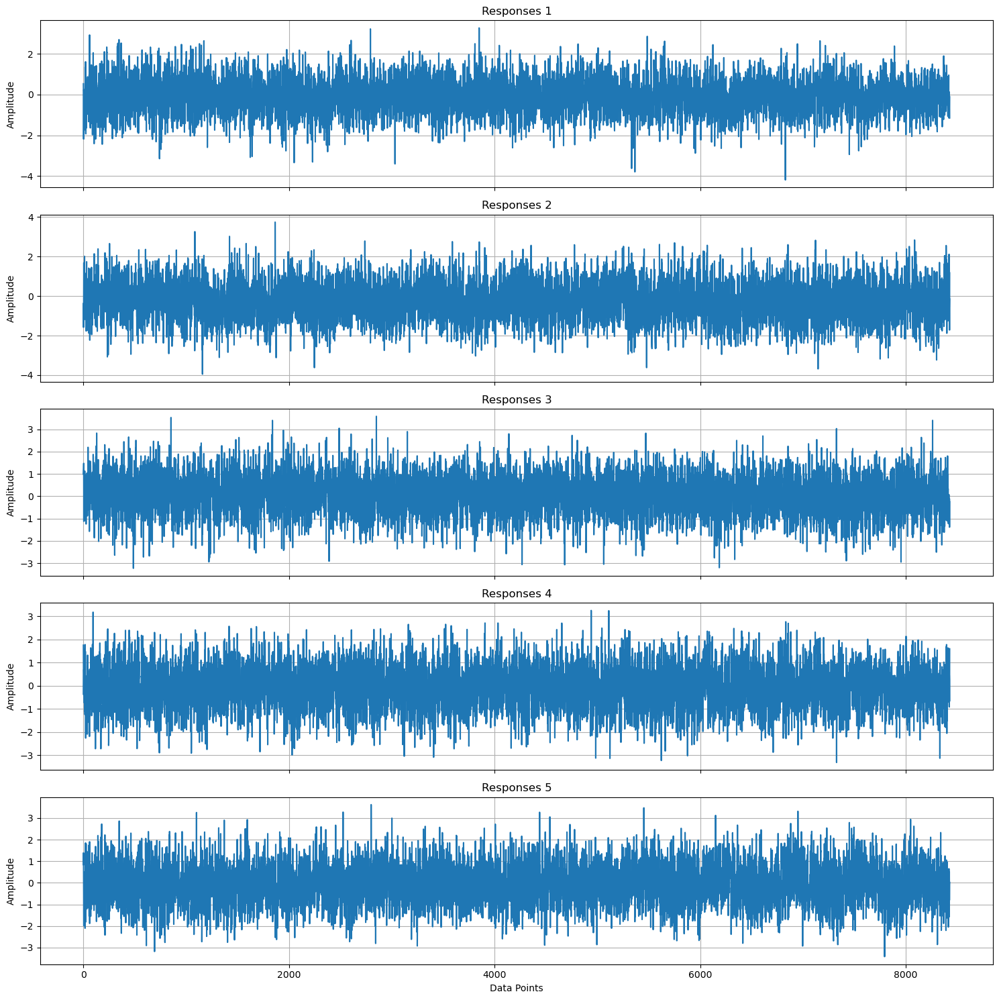

In [ ]:
# Create 10 subplots for the first 10 stimuli in the data array
fig, axes = plt.subplots(5, 1, figsize=(15, 15), sharex=True)

for i in range(5):
    axes[i].plot(dat['responses'][i])
    axes[i].set_title(f'Responses {i+1}')
    axes[i].set_ylabel('Amplitude')
    axes[i].grid(True)

plt.xlabel('Data Points')
plt.tight_layout()
plt.show()

Visual representation of the brain activity in response to the first five stimuli (images). Each graph depicts the neural response patterns corresponding to one of the images, highlighting the variations in brain activity across different regions.

In [11]:
# Load your data
responses = dat['responses']
stimuli = dat['stimuli']
stimuli = stimuli/255.0 # normalize

# Preprocess the brain wave responses
scaler = StandardScaler()
brain_wave_responses_scaled = scaler.fit_transform(dat['responses'])
pca = PCA(n_components=95, random_state=42)
brain_wave_responses_reduced = pca.fit_transform(brain_wave_responses_scaled)

In [12]:
# Define the autoencoder architecture
input_img = Input(shape=(128, 128, 1))
x = Flatten()(input_img)
encoded = Dense(128, activation='relu')(x)
decoded = Dense(128 * 128, activation='sigmoid')(encoded)
decoded = Reshape((128, 128, 1))(decoded)

# Create the autoencoder model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy')

In [13]:
# Reshape stimuli for training the autoencoder
stimuli_reshaped = stimuli.reshape(-1, 128, 128, 1)
autoencoder.fit(stimuli_reshaped, stimuli_reshaped, epochs=13, batch_size=32, validation_split=0.2)

Epoch 1/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.6838 - val_loss: 0.5575
Epoch 2/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.4348 - val_loss: 0.1771
Epoch 3/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1637 - val_loss: 0.1114
Epoch 4/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1039 - val_loss: 0.0830
Epoch 5/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0763 - val_loss: 0.0588
Epoch 6/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0513 - val_loss: 0.0379
Epoch 7/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0328 - val_loss: 0.0243
Epoch 8/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0188 - val_loss: 0.0156
Epoch 9/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0125 - val_loss: 0.0099
Epoch 10/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0076 - val_loss: 0.0063
Epoch 11/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 12/13
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0

In [14]:
# Create an encoder model to get the encoded representations
encoder = Model(input_img, encoded)

# Get the encoded representations
encoded_stimuli = encoder.predict(stimuli_reshaped)

# Elbow Method
inertias = []
silhouette_scores = []
K = range(400, 1200, 50)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(encoded_stimuli)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(encoded_stimuli, kmeans.labels_))

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


  File "c:\Users\Rodrigo\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 199, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\Rodrigo\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Rodrigo\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\Rodrigo\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


Text(0.5, 1.0, 'Silhouette Score For Optimal k')

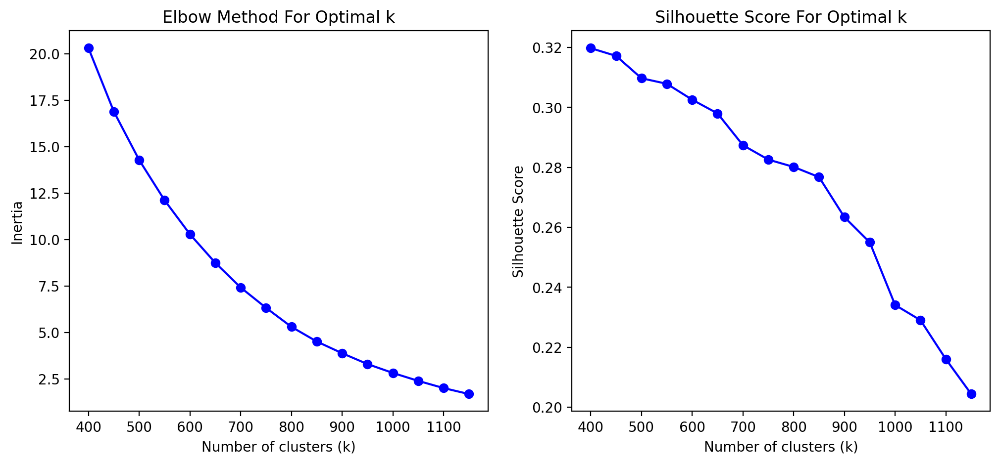

In [15]:
# Plotting Elbow Method
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(K, inertias, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')

# Plotting Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal k')

1. Elbow Method
If the elbow graph has no clear elbow, it may be difficult to use this method alone to determine the optimal number of clusters.

2. Silhouette Method
If the silhouette graph has three peaks (650, 850, 950), it suggests that there might be three distinct clustering solutions to consider. The peak values indicate the quality of the clustering at those points, with higher silhouette values indicating better-defined clusters.

In [18]:
# Perform k-means clustering
n_clusters = 950  # Choose the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(encoded_stimuli)

Decided to choose 950 because it has the deepest drop off compare to the other two peaks. 

In [19]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(brain_wave_responses_reduced, cluster_labels, test_size=0.2, random_state=42, shuffle=True)

# Define a simple neural network for classification
classifier = Sequential([
    Dense(95, input_shape=(95,), activation='relu'),
    Dropout(0.5),
    Dense(n_clusters, activation='softmax')
])

# Compile the model
classifier.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the classifier
classifier.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.0016 - loss: 10.0492 - val_accuracy: 0.0000e+00 - val_loss: 8.6225
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0096 - loss: 8.5782 - val_accuracy: 0.0036 - val_loss: 8.8339
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0339 - loss: 6.9564 - val_accuracy: 0.0071 - val_loss: 9.0264
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0650 - loss: 5.8515 - val_accuracy: 0.0071 - val_loss: 9.2713
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1141 - loss: 4.8262 - val_accuracy: 0.0071 - val_loss: 9.5424
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1849 - loss: 4.0926 - val_accuracy: 0.0071 - val_loss: 9.7878
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2794 - loss: 3.4723 - val_accuracy: 0.0071 - val_loss: 10.0888
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3621 - loss: 2.7975 - val_accuracy: 0.0071 - val

After evaluating the model with three different cluster configurations, we selected 950 clusters as it yielded the highest accuracy of 0.93. However, the validation accuracy was significantly lower at 0.0071 (compared to 0 for the other clusters), indicating that the model is overfitting to the training data. Consequently, this suggests that the current model configuration does not generalize well to unseen data.

In [31]:
def predict_image(brain_wave_response, classifier, stimuli, kmeans, scaler, pca):
    # Reduce the dimensionality of the brain wave response
    brain_wave_response = brain_wave_response.reshape(1, -1)
    
    # Predict the cluster for the brain wave response
    probabilities = classifier.predict(brain_wave_response)[0]
    most_likely_cluster = np.argmax(probabilities)
    
    # Get the indices of stimuli images belonging to the most likely cluster
    cluster_indices = np.where(kmeans.labels_ == most_likely_cluster)[0]
    
    # Randomly choose an image from the most likely cluster
    chosen_image_idx = np.random.choice(cluster_indices)
    return stimuli[chosen_image_idx]


def find_image_index(stimuli, predicted_image):
    """
    Finds the index of the predicted image in the stimuli array.

    Parameters:
    - stimuli: array of stimuli images.
    - predicted_image: the predicted image.

    Returns:
    - The index of the predicted image in the stimuli array.
    """
    for idx, img in enumerate(stimuli):
        if np.array_equal(img, predicted_image):
            return idx
    return None

Here, we were trying to predict the image shown to the research participant with the model we created based on a brain response. The second function just give us back the index of the image that was predicted (most similar) based on the neural response

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


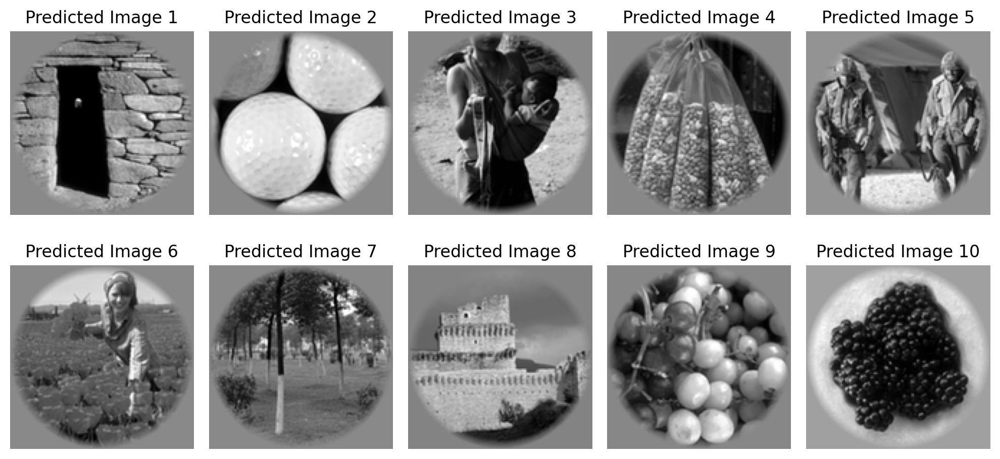

In [37]:
plt.figure(figsize=(10, 5))
for i in range(10):
    sample_response = X_test[i]
    predicted_image = predict_image(sample_response, classifier, stimuli, kmeans, scaler, pca)
    plt.subplot(2, 5, i+1)  # 2 rows, 5 columns, ith plot
    plt.imshow(predicted_image, cmap='gray')
    plt.title("Predicted Image {}".format(i+1))
    plt.axis('off')  # Turn off axis for cleaner display
plt.tight_layout()
plt.show()

# Conclusion & Discussion

Based on our results, the model does not correctly predict the image based on the neural response from the research participants. This was a very complicated problem having different responses to predict based on a image. Future research could aim to decompose the images based on orientation of each pixel and trying to understand how it is represented within the different parts of the brain and create a better sophisticated model to predict the images based on the neural response of the research participants.